In [1]:
import os

In [2]:
os.chdir("../../")

# Setup. Loading the config and the dataset here.

To get the back view leave the offset to 0. Offset 4 is the right side of the dozer and offset 8 is the left side of the dozer.

In [35]:
# init config and load dataset

import torch
from nerf_explainability.nerf_extractor.nerf_pry import NeRFExtractor
from nerf_explainability.config.nerf_config import load_config
from nerf_explainability.data.nerf_dataset import NeRFDataset
from nerf_explainability.render.nerf_render import SceneRenderer
from nerf_explainability.hooks.hooks import (
    construct_constant_mod_hook,
    construct_periodicity_mod_hook,
    construct_chain_of_hooks,
    construct_partial_band_mod_hook,
    construct_partial_direction_band_mod_hook,
    change_band_to_const,
    change_dir_frequency_band,
)
from nerf_explainability.utils.freq_embeddings import modify_periodicity

import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
nerf_cfg = load_config("./nerf_explainability/config/fern.ini")
dataset = NeRFDataset.from_dataset_type(nerf_cfg.dataset_type)(cfg=nerf_cfg, num_poses=1, offset=0)

# Load the NeRF model and scene renderer

In [ ]:
# Init the extractor and the scene renderer

nerf_extractor = NeRFExtractor(cfg=nerf_cfg)
renderer = SceneRenderer()
renderer \
    .set_dir_embedder(nerf_extractor.dir_embedder) \
    .set_pos_embedder(nerf_extractor.pos_embedder) \
    .set_model(nerf_extractor.model) \
    .set_model_fine(nerf_extractor.model_fine)

These are all the layer names of the NeRF models. We are free to attach `pre_forward` torch hooks to modify the input and see how this affects the final render

# Definition of modifying `pre-forward` hooks

We define a function that will zero out some of the Fourier embedddings frequence bands entirely. This is done to see which part of the scene is encoded in each frequency band (if any). Both the sine and cosine embeddings of the given frequency are zeroed out.

## NeRF Fourier embeddgings

NeRF doesn't directly take as input the 3D point $p = [x, y, z]$. It rather encodes the point into a higher dimension using $sin$ and $cos$ functions. This embedding is known and Fourier embedding. It is formally defined as $\gamma(x) = [sin(2^{L - 1}x), \ cos(2^{L - 1}x)] \ \textrm{where} \ L = 1 \dots 10.2$. NeRF also concatenates original 3D coordinates to the beginning of this encoding. This obtains us a 63 dimensional vector  
  
$\gamma(x) = [x, y, z, sin( x ), sin( y ), sin( z ), cos( x ), cos( y ), cos( z ), sin (2x), sin (2y), sin (2z), \dots]$  
  
You can notice how there are periodic encodings of different frequencis. Each function encodes the same 3D point, the only difference being the periodicity of the function. In order to see the effects of each of these bands, we zero them out and render the scene.

In [30]:
# attach forward hooks and do some tests

# K_int, K_ext = dataset.K, dataset.render_poses[0]
K_int, K_ext = torch.load("./nerf_explainability/data/camera/K_int_fern.pt"), torch.load("./nerf_explainability/data/camera/K_ext_fern.pt")
band_mod_fn_1 = modify_periodicity(angle_diff=-3)
band_mod_fn_3 = modify_periodicity(angle_diff=-3)
band_mod_fn_4 = modify_periodicity(angle_diff=-3)
band_mod_fn_2 = modify_periodicity(angle_diff=-3)
band_mod_fn_5 = modify_periodicity(angle_diff=-3)
band_mod_fn_6 = modify_periodicity(angle_diff=-3)
band_mod_fn_7 = modify_periodicity(angle_diff=-3)
band_mod_fn_8 = modify_periodicity(angle_diff=-3)
band_mod_fn_9 = modify_periodicity(angle_diff=-3)

# band_mod_fn_1 = change_band_to_const(val=0)
# band_mod_fn_3 = change_band_to_const(val=0)
# band_mod_fn_4 = change_band_to_const(val=0)
# band_mod_fn_2 = change_band_to_const(val=0)
# band_mod_fn_5 = change_band_to_const(val=0)
# band_mod_fn_6 = change_band_to_const(val=0)
# band_mod_fn_7 = change_band_to_const(val=0)
# band_mod_fn_8 = change_band_to_const(val=0)
# band_mod_fn_9 = change_band_to_const(val=0)

# Kovsh dzaxic
# min_x, max_x = 240, 400
# min_y, max_y = 0, 180

# 50:150, 40:180

# keter demic, kes@
# min_x, max_x = 300, 1000
# min_y, max_y = 100, 1000

# fern
min_x, max_x = 0, 250
min_y, max_y = 0, 400

# ablate_freq_band_hook = construct_periodicity_mod_hook(band_idx=9, angle_diff=-10, mask=None)

# Kovshi tex@
ablate_partial_band_hook_3 = construct_partial_band_mod_hook(
    band_idx=3,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_3,
)

ablate_partial_band_hook_4 = construct_partial_band_mod_hook(
    band_idx=4,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_4,
)

ablate_partial_band_hook_2 = construct_partial_band_mod_hook(
    band_idx=2,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_2,
)

ablate_partial_band_hook_5 = construct_partial_band_mod_hook(
    band_idx=5,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_5,
)

ablate_partial_band_hook_6 = construct_partial_band_mod_hook(
    band_idx=6,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_6,
)

ablate_partial_band_hook_8 = construct_partial_band_mod_hook(
    band_idx=8,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_8,
)

ablate_partial_band_hook_9 = construct_partial_band_mod_hook(
    band_idx=9,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_9,
)

ablate_partial_band_hook_7 = construct_partial_band_mod_hook(
    band_idx=7,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_7,
)

ablate_partial_band_hook_1 = construct_partial_band_mod_hook(
    band_idx=1,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_1,
)

# ---- DIR modifications
ablate_partial_dir_band_hook_1 = construct_partial_direction_band_mod_hook(
    band_idx=1,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_1,
)

ablate_partial_dir_band_hook_2 = construct_partial_direction_band_mod_hook(
    band_idx=2,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_2,
)

ablate_partial_dir_band_hook_3 = construct_partial_direction_band_mod_hook(
    band_idx=3,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_3,
)

ablate_partial_dir_band_hook_4 = construct_partial_direction_band_mod_hook(
    band_idx=4,
    K_int=K_int,
    K_ext=K_ext,
    min_x=min_x,
    max_x=max_x,
    min_y=min_y,
    max_y=max_y,
    band_modification_fn=band_mod_fn_4,
)

ablate_freq_band_hook = construct_chain_of_hooks([
    # ablate_partial_band_hook_1,
    # ablate_partial_band_hook_2,
    # ablate_partial_band_hook_3,
    # ablate_partial_band_hook_4,
    # ablate_partial_band_hook_5,
    # ablate_partial_band_hook_6,
    # ablate_partial_band_hook_7,
    # ablate_partial_band_hook_8,
    # ablate_partial_band_hook_9,
])

ablate_dir_freq_band_hook = construct_chain_of_hooks([
    ablate_partial_dir_band_hook_1,
    ablate_partial_dir_band_hook_2,
    ablate_partial_dir_band_hook_3,
    ablate_partial_dir_band_hook_4,
])

hooks = [
#   {
#     "type": "fine",
#     "layer_name": "pts_linears.0",
#     "hook_type": "pre_forward",
#     "hook": ablate_freq_band_hook,
#   },
#   {
#     "type": "coarse",
#     "layer_name": "pts_linears.0",
#     "hook_type": "pre_forward",
#     "hook": ablate_freq_band_hook,
#   },
    {
        "type": "fine",
        "layer_name": "views_linears.0",
        "hook_type": "pre_forward",
        "hook": ablate_dir_freq_band_hook,
    },
    {
        "type": "coarse",
        "layer_name": "views_linears.0",
        "hook_type": "pre_forward",
        "hook": ablate_dir_freq_band_hook,
    },
]

# do not forget to remove handles when not needed
handles = nerf_extractor.register_hooks(hooks=hooks)

In [ ]:
renderer.render(cfg=nerf_cfg, render_poses=dataset.render_poses, hwf=dataset.hwf, K=dataset.K, images=dataset.images)

# remove all handles
for _, h in handles.items():
  h.remove()

# After zeroing freq bands out, we render the scenes and compute absolute difference between the original scene and the scene which was rendered without certain freq band

In [46]:
# Asses the contribution of each band
from PIL import Image, ImageChops 
import numpy as np

orig_image = Image.open("./nerf_explainability/out/lego/original.png").convert("L")
orig_image_left = Image.open("./nerf_explainability/out/lego/original_left.png").convert("L")
orig_image_back = Image.open("./nerf_explainability/out/lego/original_back.png").convert("L")

In [47]:
band_contrib_images = []
band_images = []

for band in [0, 1, 2, 3, 4, 5, 6, 7, 8,]:
  band_removed_image = Image.open(f"./nerf_explainability/out/lego/bands_pts_00{band+1}.png").convert("L")
  band_images.append(band_removed_image)
  band_contrib_image = ImageChops.difference(band_removed_image, orig_image)
  
  band_contrib_images.append(np.asarray(band_contrib_image))

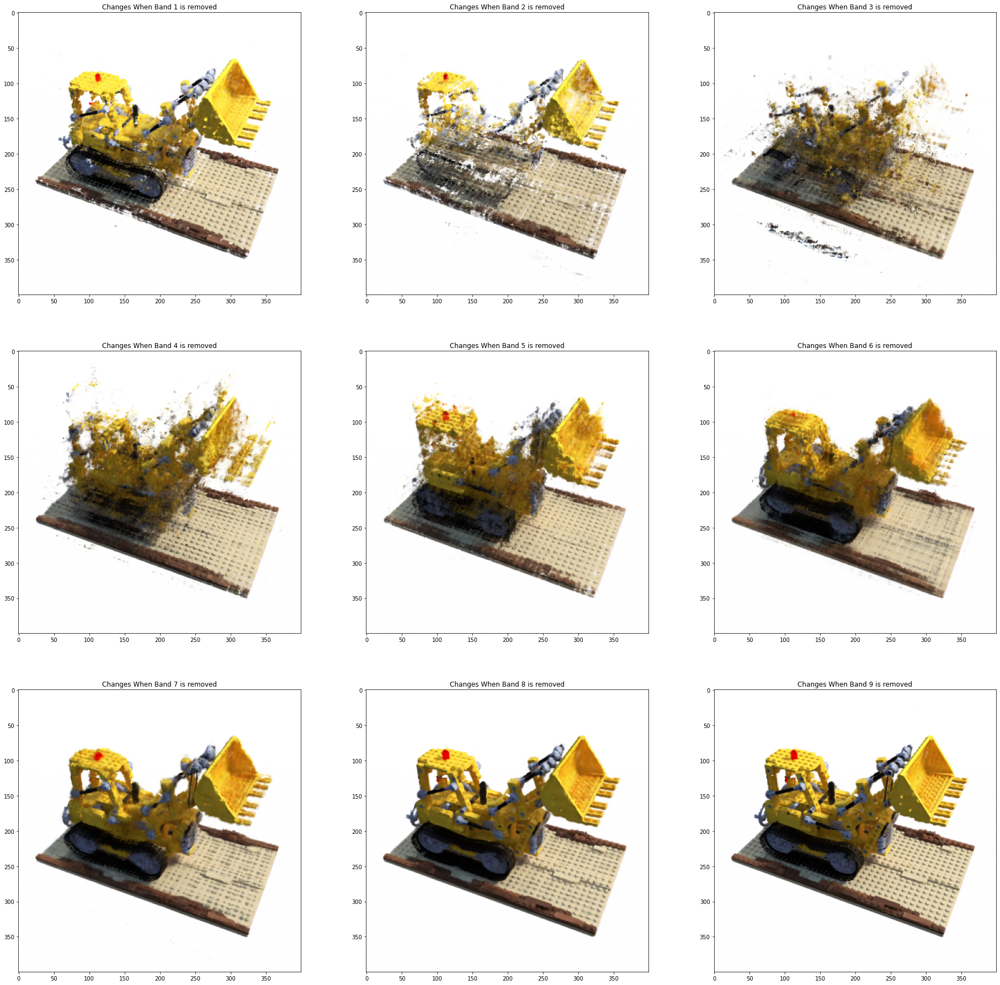

In [10]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(3, 3, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_images)):
  ax[i].imshow(band_images[i])
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

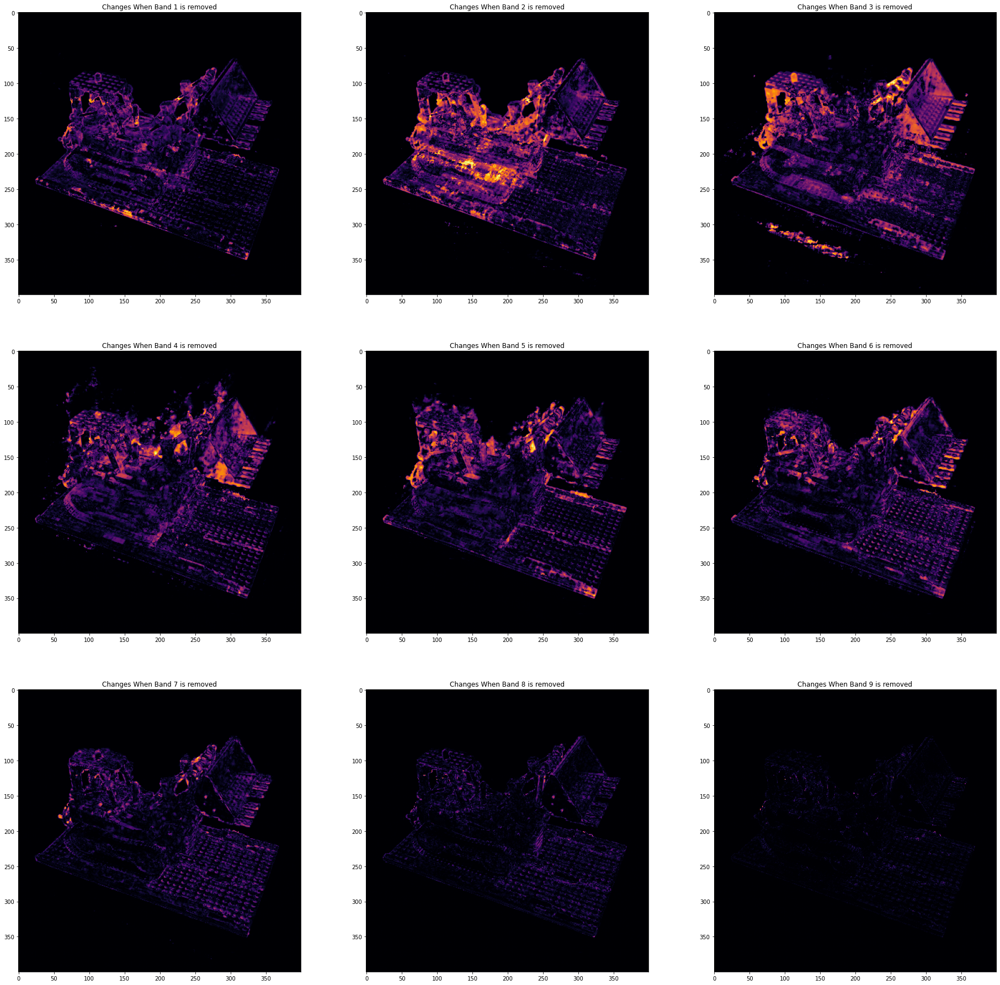

In [50]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(3, 3, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_contrib_images)):
  ax[i].imshow(band_contrib_images[i], cmap=plt.cm.inferno)
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

IndexError: index 4 is out of bounds for axis 0 with size 4

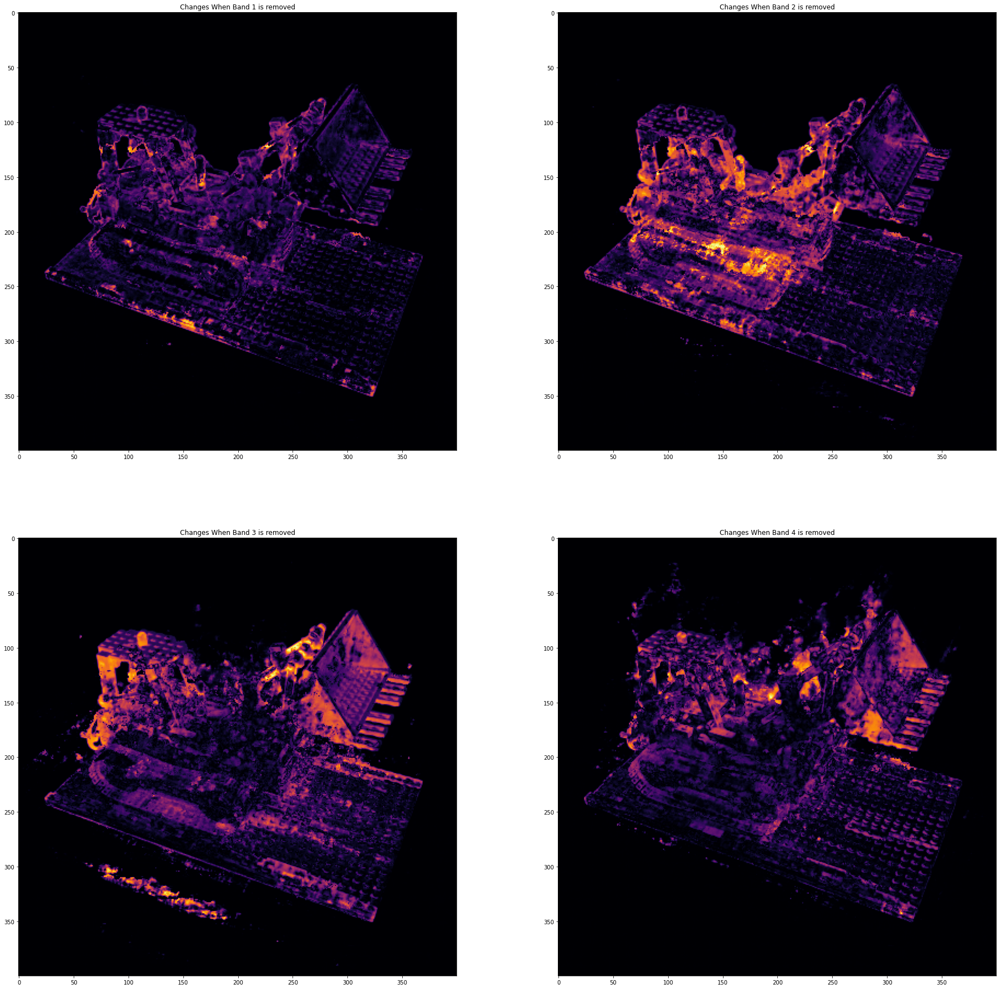

In [60]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_contrib_images)):
  ax[i].imshow(band_contrib_images[i], cmap=plt.cm.inferno)
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

In [51]:
band_contrib_images = []
band_images = []

for band in [0, 1, 2, 3]:
  band_removed_image = Image.open(f"./nerf_explainability/out/lego/band_left_00{band+1}.png").convert("L")
  band_images.append(band_removed_image)
  band_contrib_image = ImageChops.difference(band_removed_image, orig_image_left)
  
  band_contrib_images.append(np.asarray(band_contrib_image))

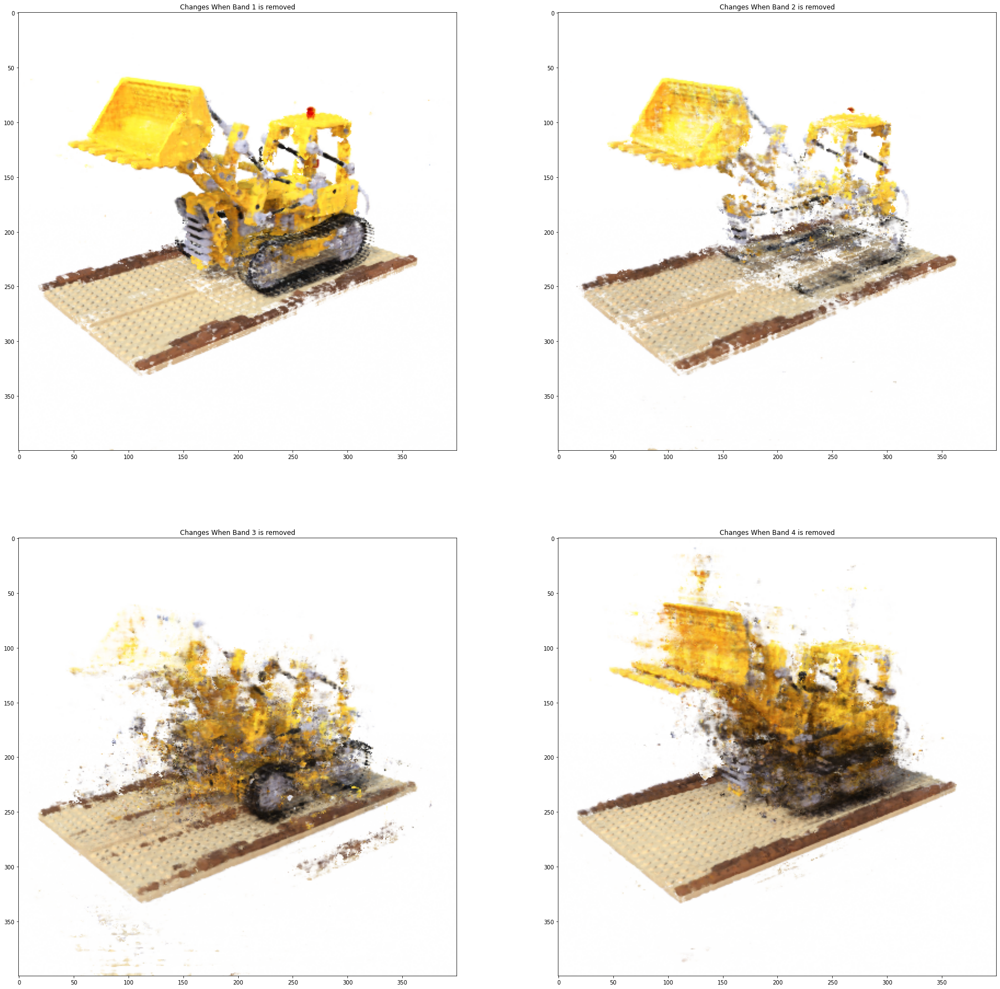

In [13]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_images)):
  ax[i].imshow(band_images[i])
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

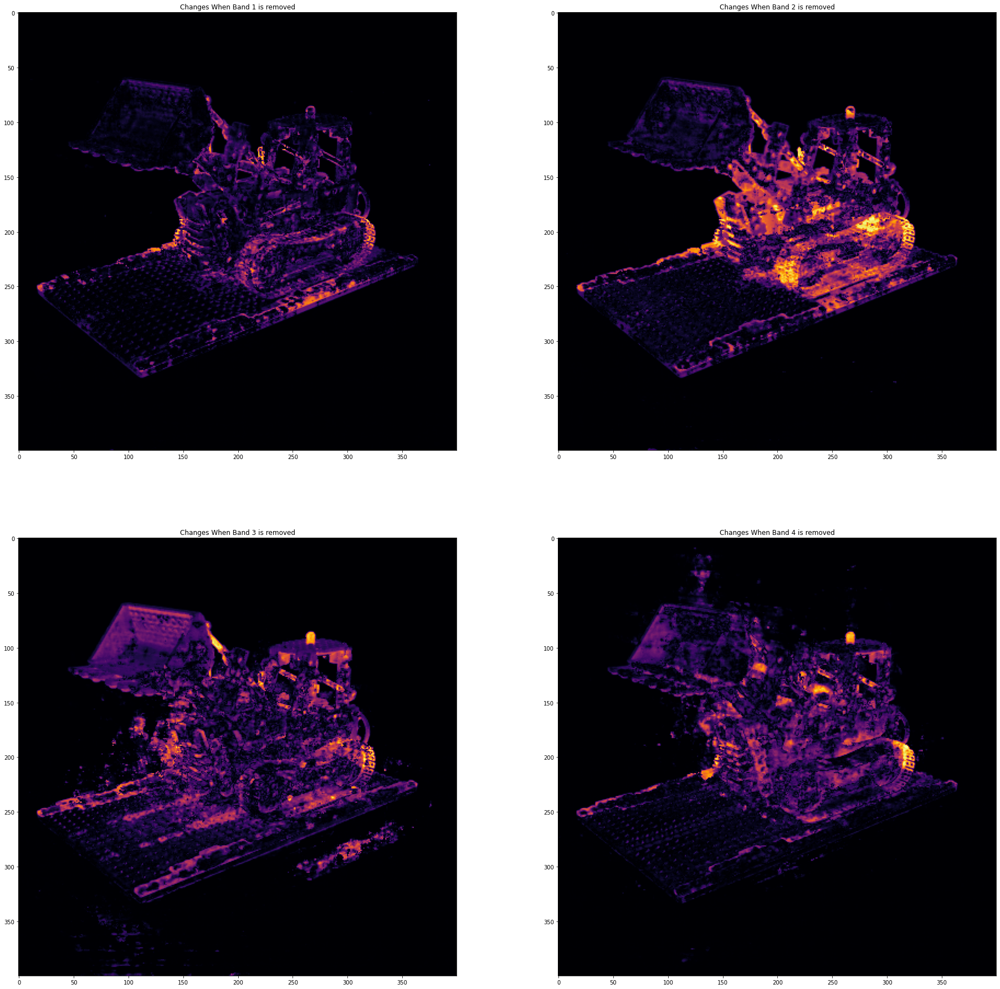

In [52]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_contrib_images)):
  ax[i].imshow(band_contrib_images[i], cmap=plt.cm.inferno)
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

In [54]:
band_contrib_images = []
band_images = []

for band in [0, 1, 2, 3]:
  band_removed_image = Image.open(f"./nerf_explainability/out/lego/band_back_00{band+1}.png").convert("L")
  band_images.append(band_removed_image)
  band_contrib_image = ImageChops.difference(orig_image_back.convert("L"), band_removed_image)
  
  band_contrib_images.append(np.asarray(band_contrib_image))

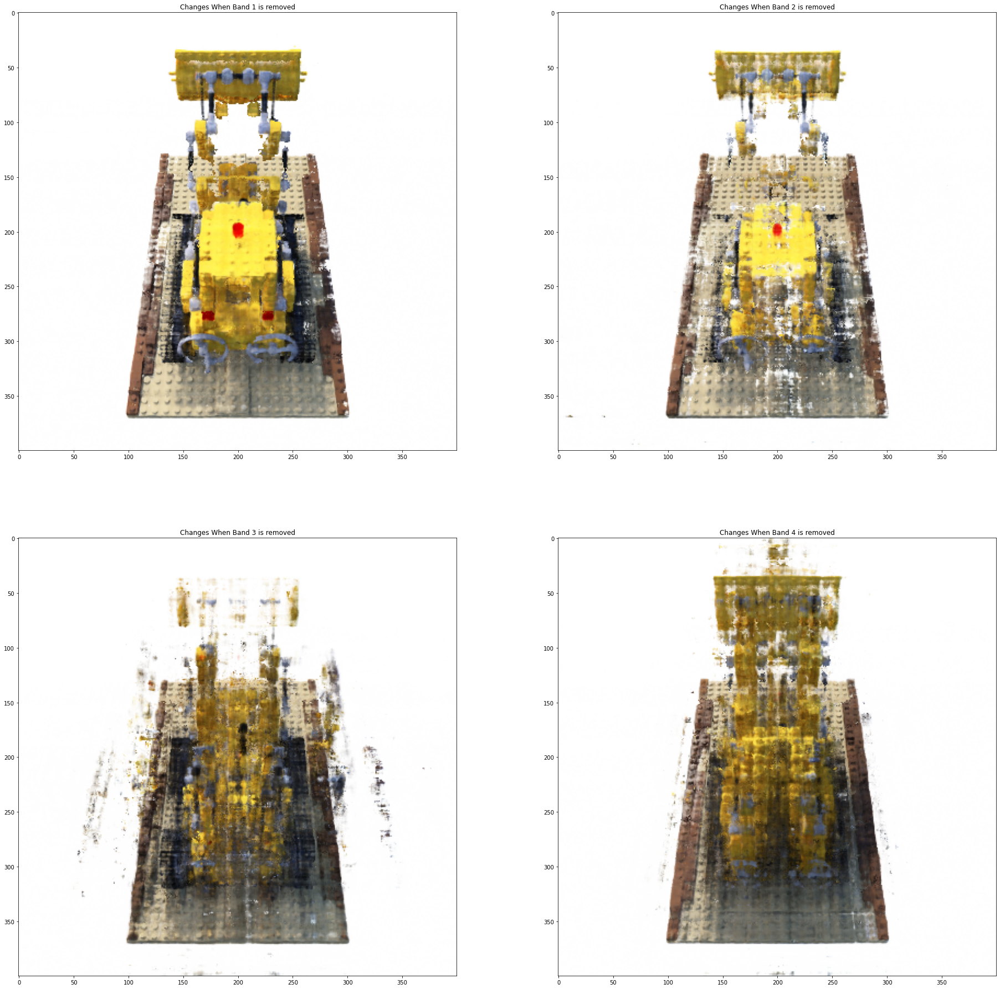

In [35]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_images)):
  ax[i].imshow(band_images[i])
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

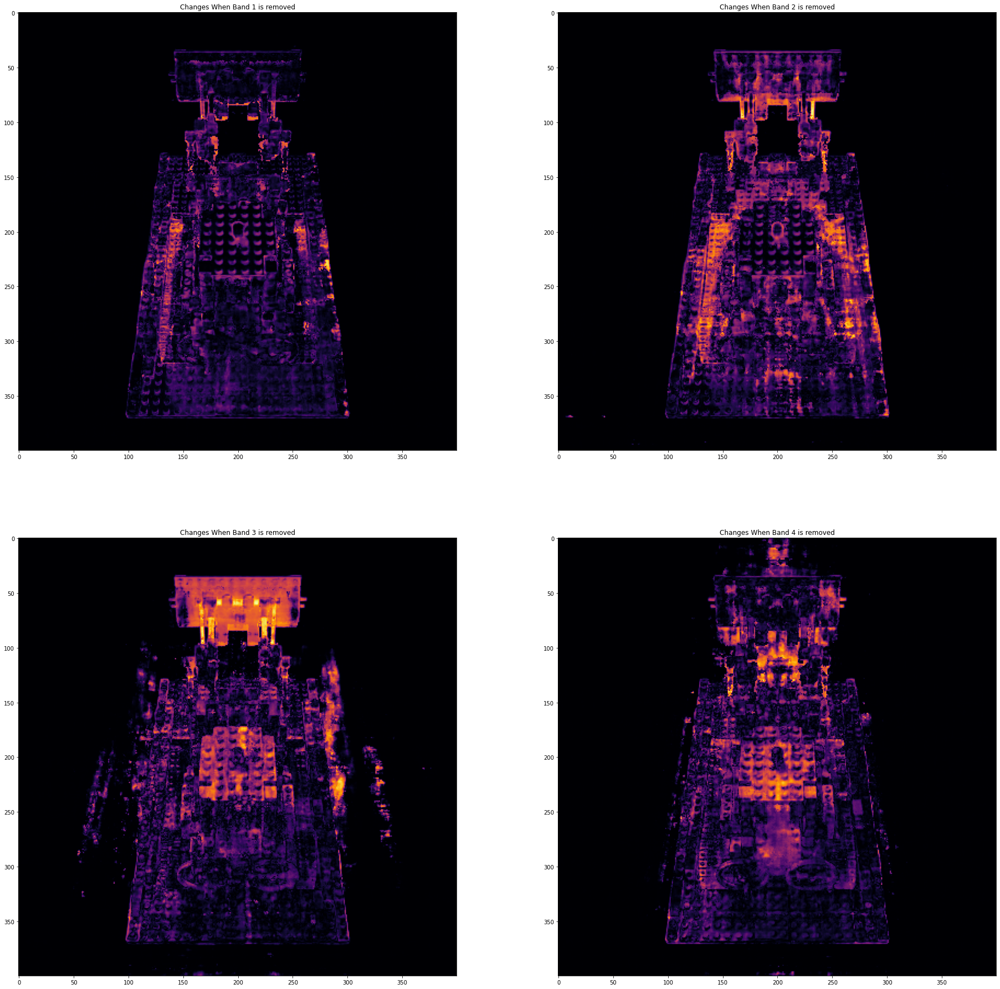

In [55]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(32, 32))
ax = ax.flatten()
for i in range(len(band_contrib_images)):
  ax[i].imshow(band_contrib_images[i], cmap=plt.cm.inferno)
  ax[i].set_title(f"Changes When Band {i + 1} is removed")
  
plt.show()

# What do the frequency bands change?

You can see that removing certain bands consistently affects same regions. Removing the band with $L = 3$, for instance, keeps removing the ladle, $L = 2$ removes the middle part and so on. Removing band with higher frequencies removes higher frequency details, smoothing out the final scene. Removing the higest frequency band results in almost 0 change.  

  
How does this happen, and where is the information about certain parts of the scene stored in the NeRF? We can take a look at the first layer to try to come up with some sort of explanation before venturing further.  

NeRF is entirely consisting of Linear layers + ReLU modules (and a tiny little skip connection). The first layer is important as thats where the direct interaction between the Fourier embedding takes place.

$h = \sigma(Wx) \ \textrm{where} \ W \in R^{256\times63}$  

The matrix-vector multiplication can be factored this way: $Wx = \sum_{i=1}^{63} W_ix_i$ and $W_i$ is the i-th column of the matrix. With this view, we can see that we are essentially disabling contribution of certain columns of the 1st weight matrix in the NeRF model. It can be that certain parts of the scene are encoded in this matrix as specific columns.  

Now, if unroll the weight matrix a bit, we can see which parts of the matrix affect what:

$$\left[\begin{array}{ccc}
x & y & z & sin(x) & sin(y) & sin(z) & cos(x) & cos(y) & cos(z) & \dots \\
\\
\hline \\
w_1 & w_2 & w_3 & w_4 & w_5 & w_6 & w_7 & w_8 & w_9 & \dots\\
\end{array}\right]$$  

Now, we can see that each of the columns of the first weight matrix contribute some parts to the overall scene. These columns are mixed in with periodical weights ranging from -1 to 1. In the later parts of this notebook, we play around with this weights. We can manually set them to values in range -1 to 1 and inspect what changes. Also, we can play around with the periodicity coefficient $2^L$ by reducing or increasing $L$ slightly. As already mentioned, setting them to 0 would also mean disabling the contribution of certain columns. Lets see what we can get by playing around with these embeddings.

Note: These $x, y, z$ coordinates are in world coordinate system, not in camera coordinate system. However, we can easily perform coordinate system transformation and get camera coordinates as well.

Setting some columns to 0 removed certain parts of the scene. So, we can try to use it to modify the geometry of the scene. However, when setting columns to zero we can notice that there is a lot of noise and aliasing as well. This means that columns are not reponsible for disentangle parts of the scene. This actually makes sense since the encoding function itself is periodic. This means that different parts of the implicit scene can end up encoded to the same value of a given frequency band. There is a 2D demonstration of this below. Each cell represents a 2D coordinated, the lower and upper triangle of each cell are the sine and cosine embeddings. There are repeating patterns. That is why removing a certain frequency band has effect over the whole scene which introduces noise.

<div align="center">
  <img src="../demo/varying_freqs/band_l=001.png" width="800px" align="center">
</div>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.tri import Triangulation

M, N = 48, 48

xs = np.linspace(-3, 3, num=M, endpoint=True)
ys = np.linspace(-3, 3, num=N, endpoint=True)

X, Y = np.meshgrid(xs, ys)
heatmap_sinx, heatmap_siny = [], []
heatmap_cosx, heatmap_cosy = [], []

L = 2

for i, j in zip(X, Y):
  sinx, cosx = np.sin(2**(L-1)*i), np.cos(2**(L-1)*i)
  siny, cosy = np.sin(2**(L-1)*j), np.cos(2**(L-1)*j)
  
  heatmap_sinx.append(np.ravel((sinx), order='F'))
  heatmap_siny.append(np.ravel((siny), order='F'))
  heatmap_cosx.append(np.ravel((cosx), order='F'))
  heatmap_cosy.append(np.ravel((cosy), order='F'))

x = np.arange(M + 1)
y = np.arange(N + 1)

X, Y = np.meshgrid(x, y)

triangles1 = [(i + j*(M+1), i+1 + j*(M+1), i + (j+1)*(M+1)) for j in range(N) for i in range(M)]
triangles2 = [(i+1 + j*(M+1), i+1 + (j+1)*(M+1), i + (j+1)*(M+1)) for j in range(N) for i in range(M)]
triang1 = Triangulation(X.ravel(), Y.ravel(), triangles1)
triang2 = Triangulation(X.ravel(), Y.ravel(), triangles2)

plt.figure(figsize=(12, 12))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
img1 = plt.tripcolor(triang1, np.array(heatmap_cosx).ravel(), cmap=cmap, vmax=1, vmin=-1)
img2 = plt.tripcolor(triang2, np.array(heatmap_cosy).ravel(), cmap=cmap, vmax=1, vmin=-1)

plt.colorbar(img2)
# plt.colorbar(img1, ticks=range(10))
plt.xlim(X.min(), X.max())
plt.ylim(Y.min(), Y.max())
plt.xticks(X.ravel(), rotation=90)
plt.yticks(Y.ravel())
plt.savefig(f"band_l=006.png", dpi=100)
plt.show()

# Now, What can we do with this?

First thing we can do is to try and remove some parts of the 3D object. In order to remove parts of the scene without destroying it we can remove frequency band only if the 3D point lies in the part that we want to remove. And a nice property of multiple-view rendering is helpful. We can project the 3D point to one of our desired views, check if the projected point lies in 2D area that we want to remove. If yes, then we remove some frequency bands by setting them to 0. Here is an example of one such mask that separates the laddle. Then, we remove several freq bands from endodings of 3D points that are projected into that area. In the example below, freq bands with power $2^3$ to $2$ are zeroed out.


<div align="center">
  <img src="../demo/removing_parts/remove_laddle.gif" width="400" align="center">
  <img src="../demo/removing_parts/mask.png" width="400" align="center">
</div>

We can also try changing the size of the laddle. All this is done by reducing the frequency band's periodicity for all the bands at the same time. In order to visualize why the size changes we can again refer to the 2D periodic encoding sample again. This time, it is animated with reducing frequency band from $2^3$ to $2^2$. To resize the laddle here, all band's frequencies are changed from $2^L$ to $2^{(L \pm 0.3)}$

<div align="center">
  <img src="../demo/size_change/ladle_resize.gif" width="400" align="center">
  <img src="../demo/size_change/ladle.gif" width="400" align="center">
</div>

<div align="center">
  <img src="../demo/varying_freqs/band_expansion.gif" width="800" align="center">
</div>

# How about playing with viewing direction embeddings?

Changing the viewing direction's freq band periodicity mainly affects the colors and the lighting. First, instead of using a sine and cosine functions, the embeddings are interpolated from -1 to 1 and the scene is rendered. This is done for bands with $2^L$ where $L \in (1, 2, 3)$ separately. The left, center and right gifs correspond to bands with coefficients $2^1, 2^2, 2^3$ respectively.

<div align="center">
  <img src="../demo/varying_dir_freqs/dir_band_02.gif" width="30%" align="center">
  <img src="../demo/varying_dir_freqs/dir_band_03.gif" width="30%" align="center">
  <img src="../demo/varying_dir_freqs/dir_band_04.gif" width="30%" align="center">
</div>

You can notice how each band changes specific features of lighting of the room. The band with $2^1$ coefficient moves the shadow behind the tree. The band with $2^2$ seems to change the lighting on the leaves while The band with $2^3$ seems to largely affects the light source in the back of the room. By varying specific parts of the embeddings one can achieve different ligthing effects.

Now, how about changing the bands coefficient like in the case of resizing the ladle of the dozer? We again obtain a change of lighting.

<div align="center">
  <img src="../demo/varying_dir_freqs/fern_change_band.gif" width="800" align="center">
</div>